In [56]:
# import libraries
import torch
import torchvision.transforms as T
from PIL import Image
import cv2
import numpy as np
import torchvision

# Load all images
image_front_path = "./goodseeds_scattered_front_S3.jpg"
image_rear_path = "./goodseeds_scattered_rear_S3.jpg"
image_left_path = "./goodseeds_scattered_left_S3.jpg"
image_right_path = "./goodseeds_scattered_right_S3.jpg"
image_top_path = "./goodseeds_scattered_top_S3.jpg"

img_front = cv2.imread(image_front_path)
img_rear = cv2.imread(image_rear_path)
img_left = cv2.imread(image_left_path)
img_right = cv2.imread(image_right_path)
img_top = cv2.imread(image_top_path)

# Load a pre-trained Faster R-CNN model from PyTorch's torchvision models (for example, COCO dataset)
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()

# Function to load and preprocess the image for detection
def detect_seeds_faster_rcnn(image_path):
    # Read the image
    img = Image.open(image_path)
    transform = T.Compose([T.ToTensor()])
    img = transform(img)

    # Perform detection
    with torch.no_grad():
        predictions = model([img])[0]

    # Extract bounding boxes with a certain confidence threshold (e.g., 0.5)
    boxes = predictions['boxes'][predictions['scores'] > 0.5].cpu().numpy().astype(int)

    return boxes

# Detect seeds in each view
boxes_front = detect_seeds_faster_rcnn(image_front_path)
boxes_left = detect_seeds_faster_rcnn(image_left_path)
boxes_right = detect_seeds_faster_rcnn(image_right_path)
boxes_top = detect_seeds_faster_rcnn(image_top_path)
boxes_rear = detect_seeds_faster_rcnn(image_rear_path)

print("Front view detected boxes: ", boxes_front)


Front view detected boxes:  [[1856  868 1971  995]]


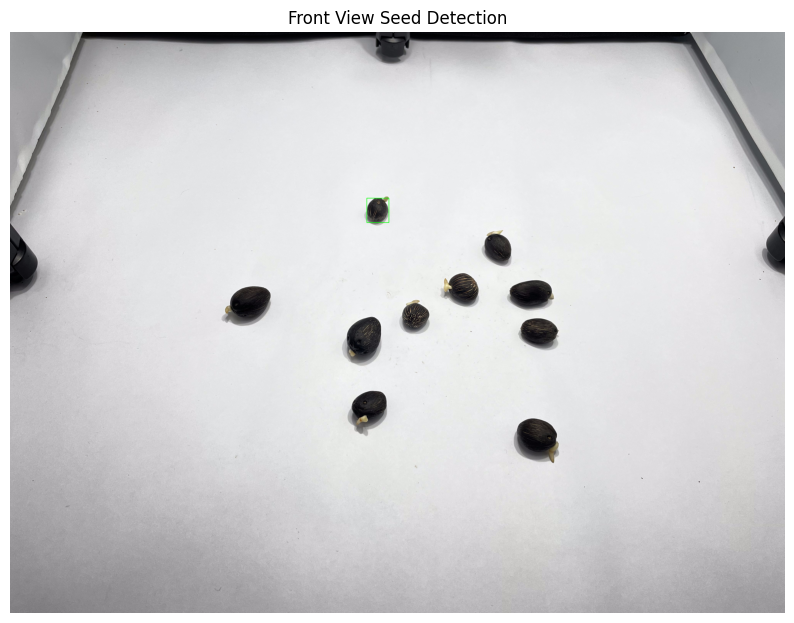

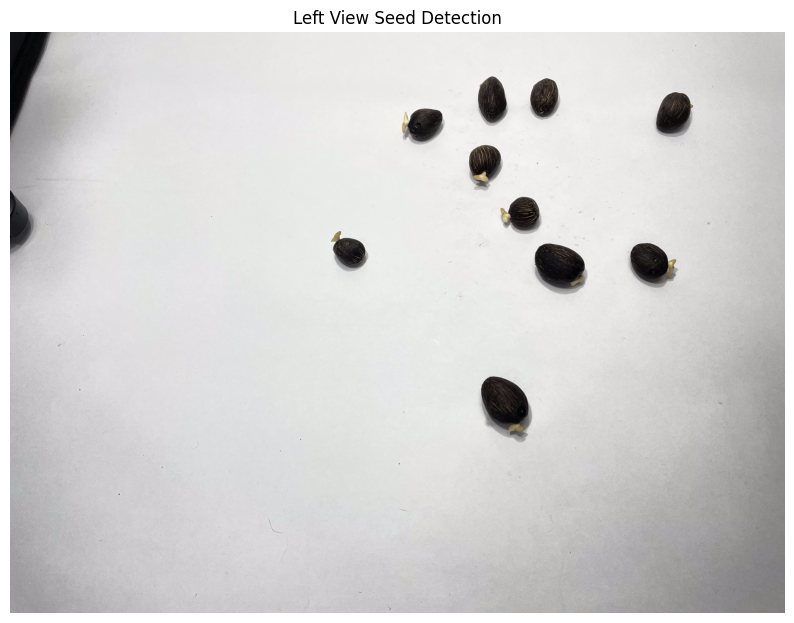

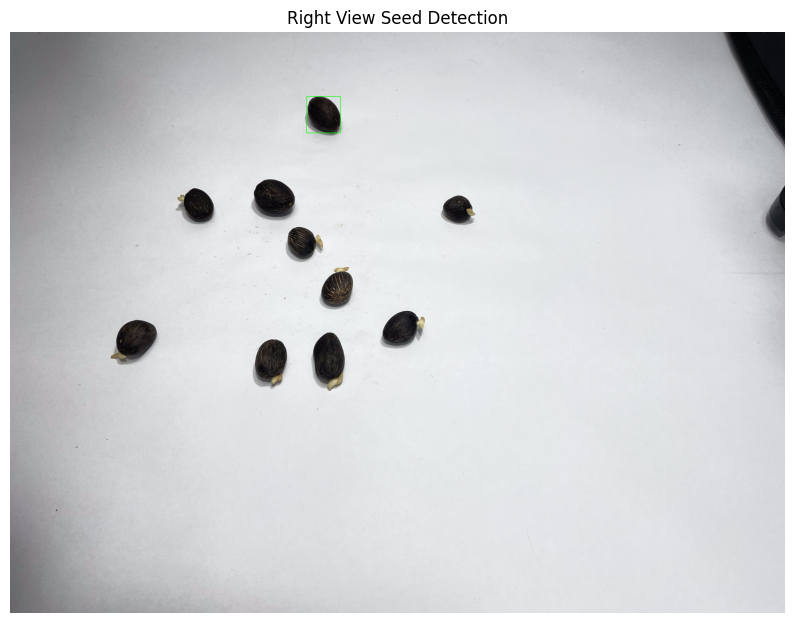

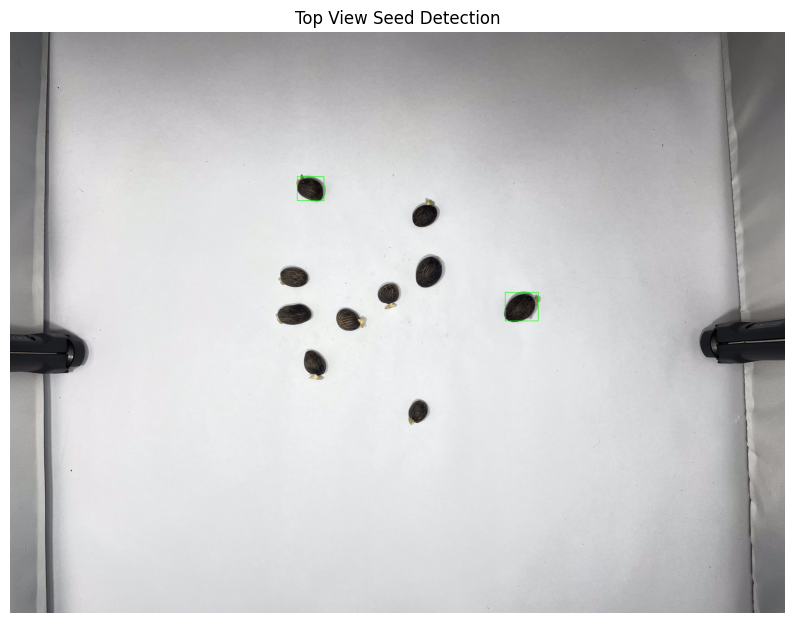

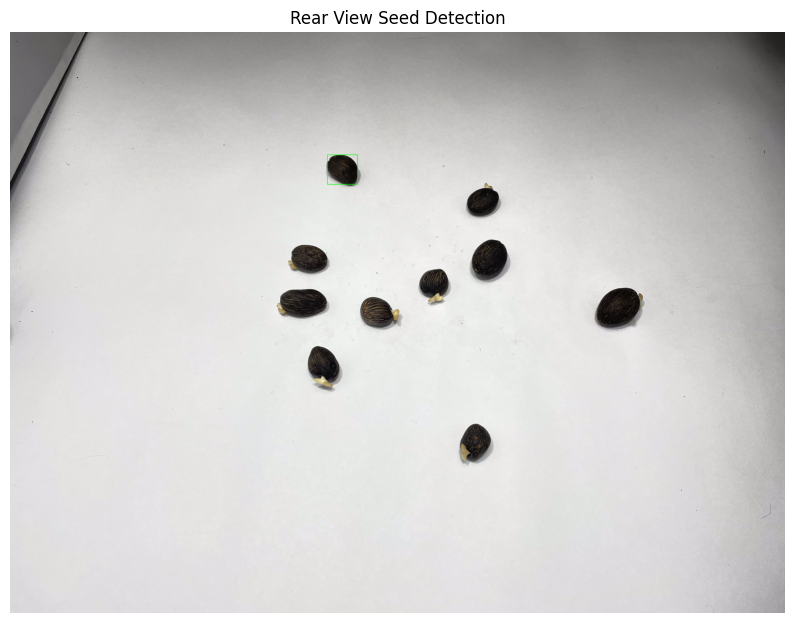

In [57]:
#Visualise detected boxes
import matplotlib.pyplot as plt
import cv2

# Function to draw bounding boxes on the image
def draw_boxes(image, boxes):
    img_copy = image.copy()
    for box in boxes:
        x1, y1, x2, y2 = map(int, box)
        cv2.rectangle(img_copy, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Draw green bounding box
    return img_copy

# Draw bounding boxes on the images for each view
img_front_with_boxes = draw_boxes(img_front, boxes_front)
img_left_with_boxes = draw_boxes(img_left, boxes_left)
img_right_with_boxes = draw_boxes(img_right, boxes_right)
img_top_with_boxes = draw_boxes(img_top, boxes_top)
img_rear_with_boxes = draw_boxes(img_rear, boxes_rear)

# Function to display images with bounding boxes
def display_image_with_boxes(image, title):
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for matplotlib
    plt.title(title)
    plt.axis('off')
    plt.show()

# Display each image with the detected seed bounding boxes
display_image_with_boxes(img_front_with_boxes, "Front View Seed Detection")
display_image_with_boxes(img_left_with_boxes, "Left View Seed Detection")
display_image_with_boxes(img_right_with_boxes, "Right View Seed Detection")
display_image_with_boxes(img_top_with_boxes, "Top View Seed Detection")
display_image_with_boxes(img_rear_with_boxes, "Rear View Seed Detection")


In [58]:
# Function to crop seed regions from an image based on bounding boxes
def crop_seeds(image, boxes):
    seeds = []
    for box in boxes:
        x1, y1, x2, y2 = map(int, box)
        seed = image[y1:y2, x1:x2]
        seeds.append(seed)
    return seeds

# Crop seed regions for each view
seeds_front = crop_seeds(img_front, boxes_front)
seeds_left = crop_seeds(img_left, boxes_left)
seeds_right = crop_seeds(img_right, boxes_right)
seeds_top = crop_seeds(img_top, boxes_top)
seeds_rear = crop_seeds(img_rear, boxes_rear)

print(f"Cropped {len(seeds_front)} seed regions from the front view.")


Cropped 1 seed regions from the front view.


In [59]:
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

In [60]:
# Function to detect keypoints and descriptors
def detect_keypoints_and_descriptors(image):
    sift = cv2.SIFT_create()
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    keypoints, descriptors = sift.detectAndCompute(gray, None)
    return keypoints, descriptors

# Detect keypoints and descriptors for all views
keypoints_front, descriptors_front = detect_keypoints_and_descriptors(img_front)
keypoints_left, descriptors_left = detect_keypoints_and_descriptors(img_left)
keypoints_right, descriptors_right = detect_keypoints_and_descriptors(img_right)
keypoints_top, descriptors_top = detect_keypoints_and_descriptors(img_top)
keypoints_rear, descriptors_rear = detect_keypoints_and_descriptors(img_rear)

# Make sure descriptors are not None
if descriptors_front is None or descriptors_left is None or descriptors_right is None or descriptors_top is None or descriptors_rear is None:
    print("Error: One of the descriptors is None. Please check if keypoints were detected properly.")


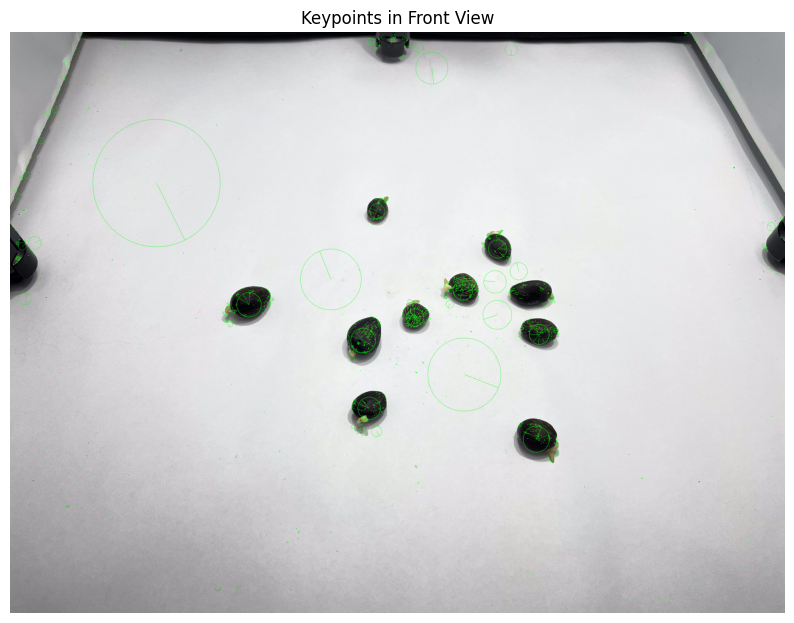

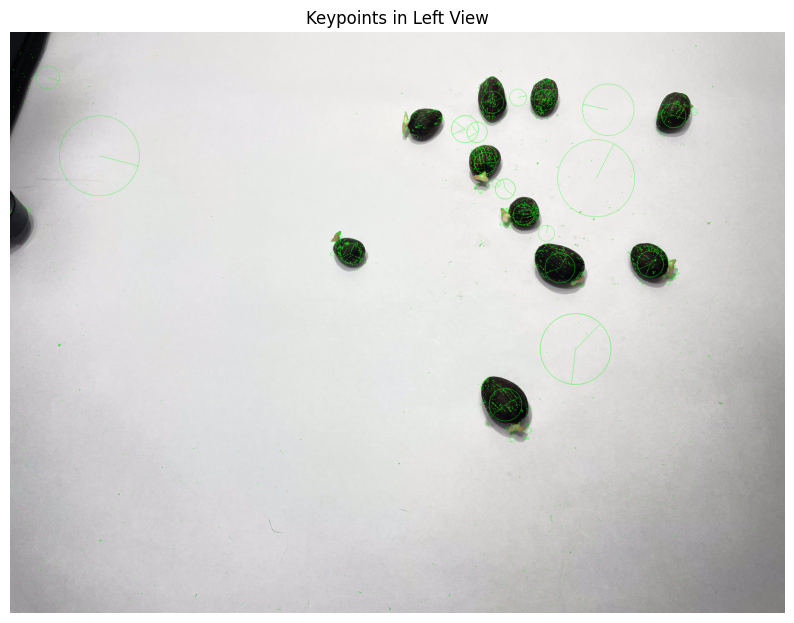

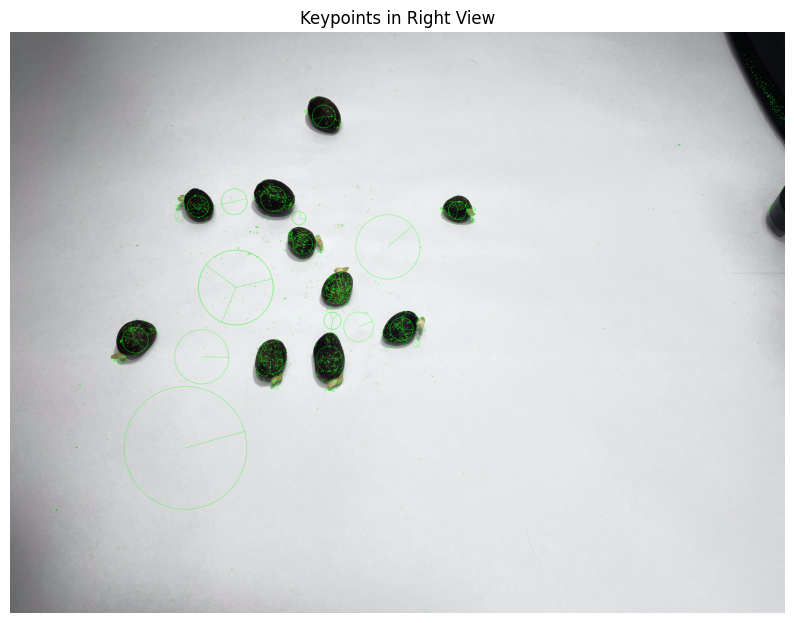

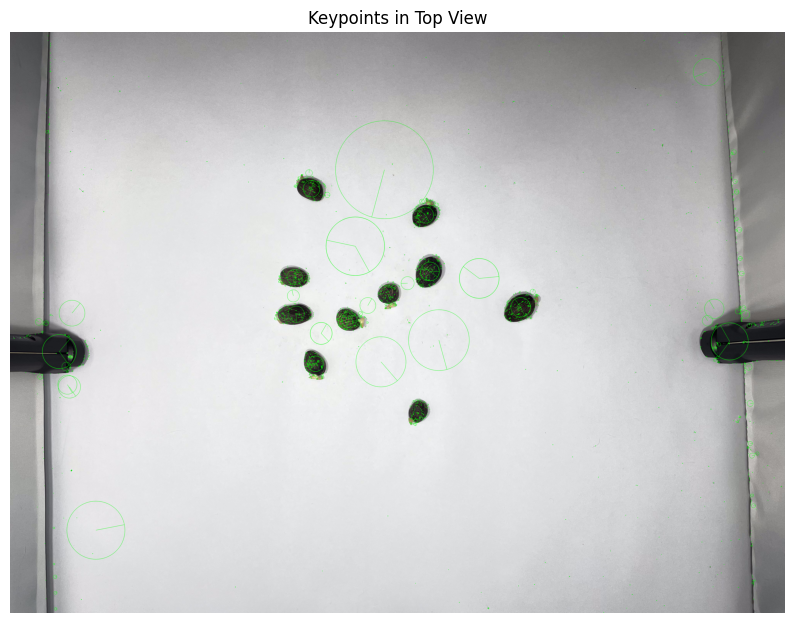

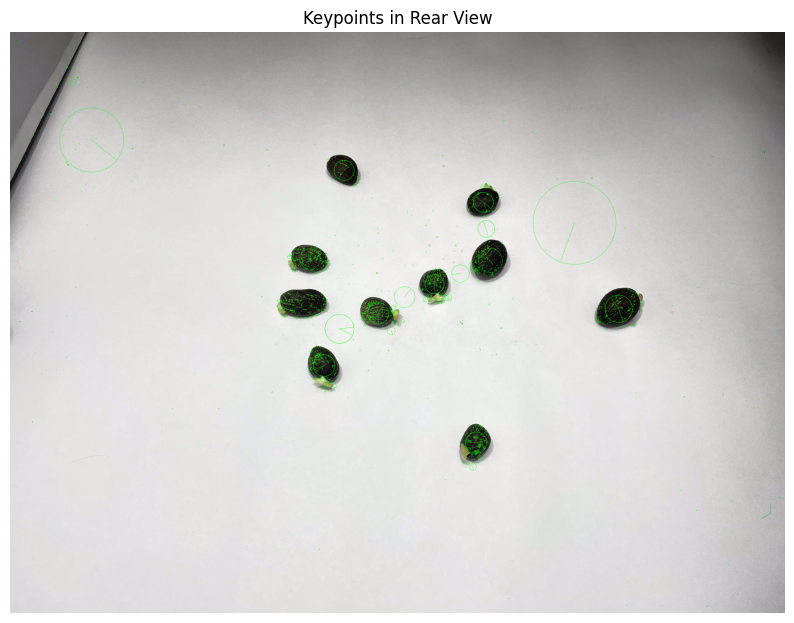

In [61]:
# Visualize Keypoints
import matplotlib.pyplot as plt
import cv2

# Function to visualize keypoints
def visualize_keypoints(image, keypoints, title):
    # Draw keypoints on the image
    img_with_keypoints = cv2.drawKeypoints(image, keypoints, None, color=(0, 255, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    # Display the image with keypoints using matplotlib
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(img_with_keypoints, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis('off')
    plt.show()

# Visualize keypoints for each view
visualize_keypoints(img_front, keypoints_front, 'Keypoints in Front View')
visualize_keypoints(img_left, keypoints_left, 'Keypoints in Left View')
visualize_keypoints(img_right, keypoints_right, 'Keypoints in Right View')
visualize_keypoints(img_top, keypoints_top, 'Keypoints in Top View')
visualize_keypoints(img_rear, keypoints_rear, 'Keypoints in Rear View')


In [62]:
# Match keypoints using BFMatcher
def match_keypoints(des_front, des_other):
    # Check if descriptors are not None
    if des_front is None or des_other is None:
        print("Descriptors are None, cannot perform matching.")
        return []

    # BFMatcher
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    matches = bf.match(des_front, des_other)
    matches = sorted(matches, key=lambda x: x.distance)  # Sort by distance (quality of match)
    return matches

# Match keypoints between front and other views
matches_front = match_keypoints(descriptors_front, descriptors_front)
matches_left = match_keypoints(descriptors_front, descriptors_left)
matches_right = match_keypoints(descriptors_front, descriptors_right)
matches_top = match_keypoints(descriptors_front, descriptors_top)
matches_rear = match_keypoints(descriptors_front, descriptors_rear)

print("Keypoints matched between front and other views.")


Keypoints matched between front and other views.


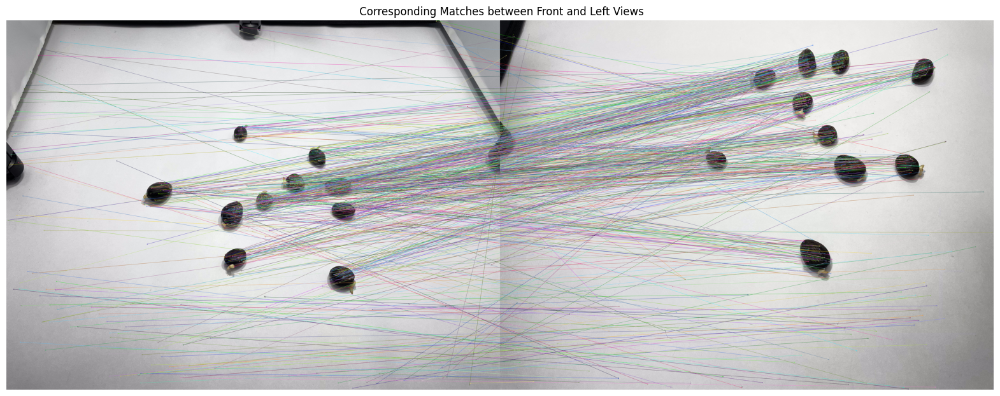

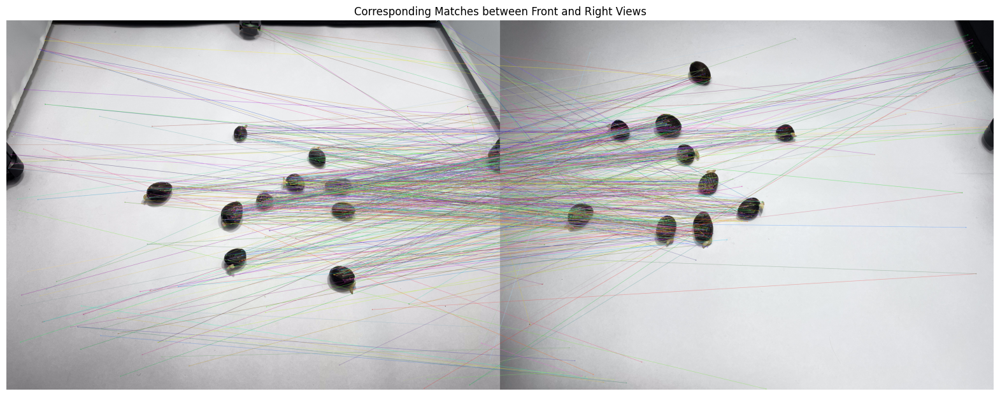

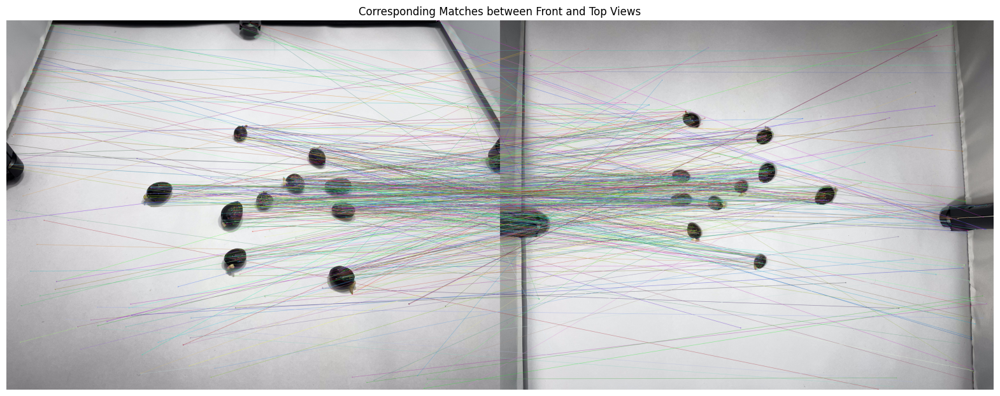

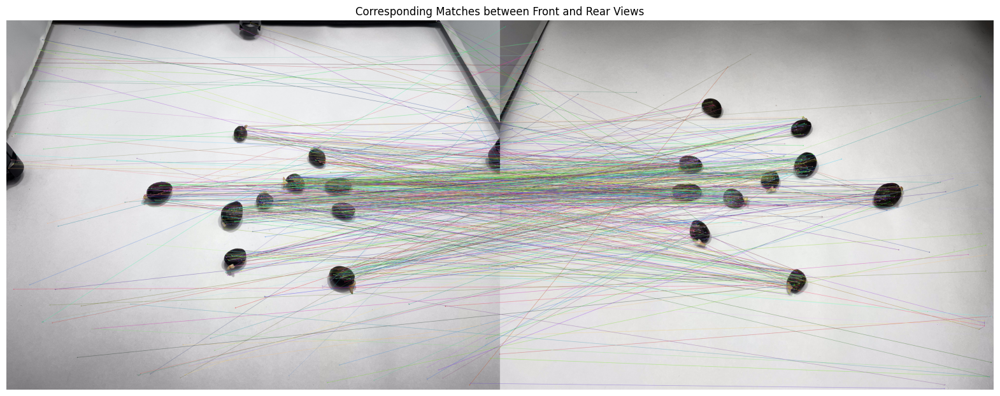

In [63]:
# Function to visualize corresponding matches between two images
import matplotlib.pyplot as plt
def visualize_matches(img1, kp1, img2, kp2, matches, title):
    if len(matches) == 0:
        print(f"No matches found between {title}")
        return

    img_matches = cv2.drawMatches(img1, kp1, img2, kp2, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.figure(figsize=(20, 10))
    plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis('off')
    plt.show()

# Visualize matches between front and other views
visualize_matches(img_front, keypoints_front, img_left, keypoints_left, matches_left, ' Corresponding Matches between Front and Left Views')
visualize_matches(img_front, keypoints_front, img_right, keypoints_right, matches_right, 'Corresponding Matches between Front and Right Views')
visualize_matches(img_front, keypoints_front, img_top, keypoints_top, matches_top, 'Corresponding Matches between Front and Top Views')
visualize_matches(img_front, keypoints_front, img_rear, keypoints_rear, matches_rear, 'Corresponding Matches between Front and Rear Views')


In [64]:
# Compute homography using matched keypoints
def compute_homography(kp1, kp2, matches):
    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
    homography_matrix, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    return homography_matrix

# Compute homographies
homography_left = compute_homography(keypoints_front, keypoints_left, matches_left)
homography_right = compute_homography(keypoints_front, keypoints_right, matches_right)
homography_top = compute_homography(keypoints_front, keypoints_top, matches_top)
homography_rear = compute_homography(keypoints_front, keypoints_rear, matches_rear)

print("Homography matrices computed for each view.")
print("\nHomography Matrix (Front to Left View):\n", homography_left)
print("\nHomography Matrix (Front to Right View):\n", homography_right)
print("\nHomography Matrix (Front to Top View):\n", homography_top)
print("\nHomography Matrix (Front to Rear View):\n", homography_rear)

Homography matrices computed for each view.

Homography Matrix (Front to Left View):
 [[-1.39535655e+00 -3.63931159e-01  3.19053144e+03]
 [-5.36966763e-01 -2.39166319e-01  1.41779300e+03]
 [-4.74647980e-04 -8.37733765e-05  1.00000000e+00]]

Homography Matrix (Front to Right View):
 [[-1.31736728e+00  3.53226394e-01  3.96019565e+03]
 [ 2.75703021e-01  1.43961560e+00 -1.48583838e+03]
 [-9.49569248e-04  1.46437803e-03  1.00000000e+00]]

Homography Matrix (Front to Top View):
 [[-8.50938769e-01  1.42544636e-01  2.55007316e+03]
 [-3.11969551e-01 -2.70026058e-01  1.70974197e+03]
 [-2.79608454e-04  5.27531618e-05  1.00000000e+00]]

Homography Matrix (Front to Rear View):
 [[-5.87495498e+00  6.61204078e+00  2.42360651e+03]
 [-2.99607852e+00  3.39135262e+00  1.19737930e+03]
 [-2.42681590e-03  2.72901578e-03  1.00000000e+00]]


Images successfully warped to align with the front view.


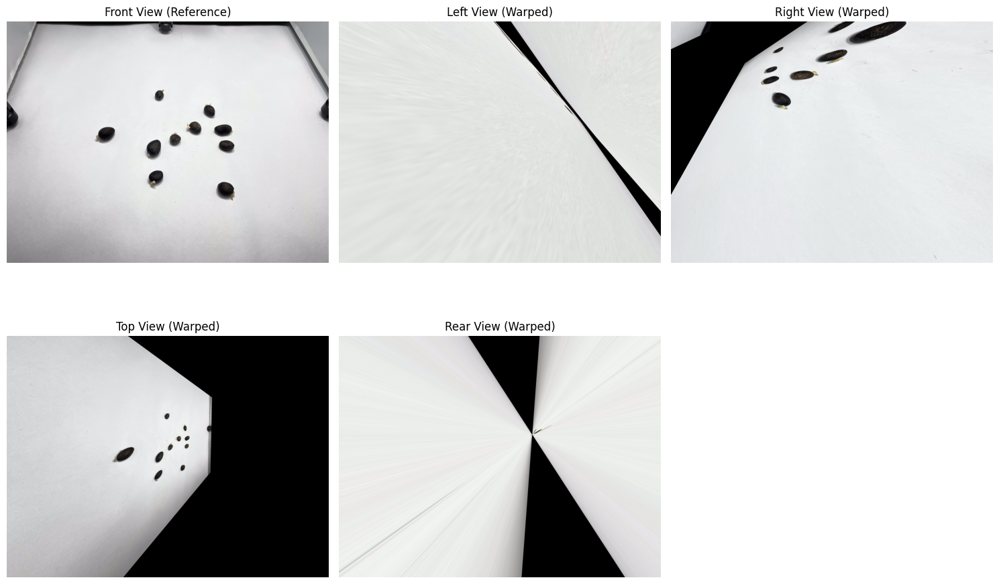

In [65]:
# Load the front view and warp other images to align with the front view

# Warp images using the computed homography matrices
img_left_warped = cv2.warpPerspective(cv2.imread(image_left_path), homography_left, (img_front.shape[1], img_front.shape[0]))
img_right_warped = cv2.warpPerspective(cv2.imread(image_right_path), homography_right, (img_front.shape[1], img_front.shape[0]))
img_top_warped = cv2.warpPerspective(cv2.imread(image_top_path), homography_top, (img_front.shape[1], img_front.shape[0]))
img_rear_warped = cv2.warpPerspective(cv2.imread(image_rear_path), homography_rear, (img_front.shape[1], img_front.shape[0]))

print("Images successfully warped to align with the front view.")

# Convert BGR to RGB for visualization
img_front_rgb = cv2.cvtColor(img_front, cv2.COLOR_BGR2RGB)
img_left_warped_rgb = cv2.cvtColor(img_left_warped, cv2.COLOR_BGR2RGB)
img_right_warped_rgb = cv2.cvtColor(img_right_warped, cv2.COLOR_BGR2RGB)
img_top_warped_rgb = cv2.cvtColor(img_top_warped, cv2.COLOR_BGR2RGB)
img_rear_warped_rgb = cv2.cvtColor(img_rear_warped, cv2.COLOR_BGR2RGB)

# Create subplots to display images
plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.imshow(img_front_rgb)
plt.title("Front View (Reference)")
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(img_left_warped_rgb)
plt.title("Left View (Warped)")
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(img_right_warped_rgb)
plt.title("Right View (Warped)")
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(img_top_warped_rgb)
plt.title("Top View (Warped)")
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(img_rear_warped_rgb)
plt.title("Rear View (Warped)")
plt.axis('off')

plt.tight_layout()
plt.show()


In [66]:
from skimage.metrics import structural_similarity as ssim

# Function to compute SSIM between images
def compute_ssim(img1, img2):
    gray_img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    gray_img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
    return ssim(gray_img1, gray_img2)

# Calculate SSIM
ssim_left = compute_ssim(img_front, img_left_warped)
ssim_right = compute_ssim(img_front, img_right_warped)
ssim_top = compute_ssim(img_front, img_top_warped)
ssim_rear = compute_ssim(img_front, img_rear_warped)

print(f"SSIM (Left): {ssim_left}, SSIM (Right): {ssim_right}, SSIM (Top): {ssim_top}, SSIM (Rear): {ssim_rear}")


SSIM (Left): 0.6789153084548093, SSIM (Right): 0.6145076507148338, SSIM (Top): 0.3237437336156848, SSIM (Rear): 0.584237255545375


In [67]:
# Function to compute MSE between images
def compute_mse(img1, img2):
    err = np.sum((img1.astype("float") - img2.astype("float")) ** 2)
    err /= float(img1.shape[0] * img1.shape[1])
    return err

# Calculate MSE
mse_left = compute_mse(img_front, img_left_warped)
mse_right = compute_mse(img_front, img_right_warped)
mse_top = compute_mse(img_front, img_top_warped)
mse_rear = compute_mse(img_front, img_rear_warped)

print(f"MSE (Left): {mse_left}, MSE (Right): {mse_right}, MSE (Top): {mse_top}, MSE (Rear): {mse_rear}")


MSE (Left): 10576.97782373945, MSE (Right): 20187.10443510448, MSE (Top): 65099.12999501016, MSE (Rear): 26078.197762969


In [68]:
# Function to compute Average Corner Error (ACE)
def compute_ace(homography_matrix, img_shape):
    h, w = img_shape[:2]

    # Define the corners of the image
    corners = np.array([[0, 0], [0, h-1], [w-1, h-1], [w-1, 0]], dtype='float32')
    corners = np.array([corners])

    # Project the corners using the homography matrix
    projected_corners = cv2.perspectiveTransform(corners, homography_matrix)

    # Compute the average Euclidean distance between the original and warped corners
    error = np.sqrt(np.sum((corners - projected_corners) ** 2, axis=2)).mean()

    return error

# Calculate ACE
ace_left = compute_ace(homography_left, img_front.shape)
ace_right = compute_ace(homography_right, img_front.shape)
ace_top = compute_ace(homography_top, img_front.shape)
ace_rear = compute_ace(homography_rear, img_front.shape)

print(f"ACE (Left): {ace_left}, ACE (Right): {ace_right}, ACE (Top): {ace_top}, ACE (Rear): {ace_rear}")


ACE (Left): 2651.437255859375, ACE (Right): 3672.154296875, ACE (Top): 8492.7109375, ACE (Rear): 2554.296142578125


In [69]:
# Print all evaluation metrics for each view alignment
print(f"Evaluation Results:")
print(f"SSIM (Left): {ssim_left}, MSE (Left): {mse_left}, ACE (Left): {ace_left}")
print(f"SSIM (Right): {ssim_right}, MSE (Right): {mse_right}, ACE (Right): {ace_right}")
print(f"SSIM (Top): {ssim_top}, MSE (Top): {mse_top}, ACE (Top): {ace_top}")
print(f"SSIM (Rear): {ssim_rear}, MSE (Rear): {mse_rear}, ACE (Rear): {ace_rear}")


Evaluation Results:
SSIM (Left): 0.6789153084548093, MSE (Left): 10576.97782373945, ACE (Left): 2651.437255859375
SSIM (Right): 0.6145076507148338, MSE (Right): 20187.10443510448, ACE (Right): 3672.154296875
SSIM (Top): 0.3237437336156848, MSE (Top): 65099.12999501016, ACE (Top): 8492.7109375
SSIM (Rear): 0.584237255545375, MSE (Rear): 26078.197762969, ACE (Rear): 2554.296142578125


In [70]:
# import evaluation metric libraries
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC

In [71]:
# Aggregate matches from all views
def aggregate_keypoints(matches_front, matches_left, matches_right, matches_top, matches_rear):
    aggregated_matches = []
    for i, match_front in enumerate(matches_front):
        # Find corresponding matches in all other views for the same seed
        match_left = matches_left[i] if i < len(matches_left) else None
        match_right = matches_right[i] if i < len(matches_right) else None
        match_top = matches_top[i] if i < len(matches_top) else None
        match_rear = matches_rear[i] if i < len(matches_rear) else None

        # Aggregate information for multi-view analysis
        aggregated_matches.append({
            'front': match_front,
            'left': match_left,
            'right': match_right,
            'top': match_top,
            'rear': match_rear
        })
    return aggregated_matches

# Aggregate all keypoints across views
aggregated_keypoints = aggregate_keypoints(matches_front, matches_left, matches_right, matches_top, matches_rear)

print("Aggregated keypoints from all views.")


Aggregated keypoints from all views.


In [72]:
# Perform multi-view classification
def classify_seed(aggregated_matches):
    classified_labels = []
    for match in aggregated_matches:
        # Simple logic: if a match exists in any of the views, classify as 'Good'
        if match['front'] or match['left'] or match['right'] or match['top'] or match['rear']:
            classified_labels.append("Good")
        else:
            classified_labels.append("Bad")
    return classified_labels

# Classify each seed based on multi-view information
multi_view_labels = classify_seed(aggregated_keypoints)

print("Multi-view classification completed.")


Multi-view classification completed.


In [73]:
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix

# Example labels (replace these with your actual data)
true_labels = ["Bad", "Good", "Bad", "Good", "Bad"]  # Replace with actual ground truth labels
multi_view_labels = ["Bad", "Good", "Bad", "Good", "Good"]  # Example predicted labels for keypoints

# Let's assume each seed has multiple keypoints, and we're classifying based on the majority of keypoint predictions
def aggregate_seed_labels(keypoint_labels, seeds_count):
    seed_labels = []
    keypoints_per_seed = len(keypoint_labels) // seeds_count  # assuming evenly distributed keypoints
    for i in range(seeds_count):
        seed_keypoint_labels = keypoint_labels[i * keypoints_per_seed:(i + 1) * keypoints_per_seed]
        # Use majority voting to determine the seed's label
        seed_label = max(set(seed_keypoint_labels), key=seed_keypoint_labels.count)
        seed_labels.append(seed_label)
    return seed_labels

# Aggregate keypoint labels to get seed-level labels
multi_view_labels_seed = aggregate_seed_labels(multi_view_labels, len(true_labels))

# Recalculate classification metrics with aggregated seed labels
precision = precision_score(true_labels, multi_view_labels_seed, pos_label='Good')
recall = recall_score(true_labels, multi_view_labels_seed, pos_label='Good')
f1 = f1_score(true_labels, multi_view_labels_seed, pos_label='Good')

# Calculate confusion matrix
conf_matrix = confusion_matrix(true_labels, multi_view_labels_seed)

# Print the classification metrics
print(f"Multi-View Classification Metrics:")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1-Score: {f1}")
print(f"Confusion Matrix:\n{conf_matrix}")


Multi-View Classification Metrics:
Precision: 0.6666666666666666
Recall: 1.0
F1-Score: 0.8
Confusion Matrix:
[[2 1]
 [0 2]]
